# Practical Five: Optical Flow

This notebook is prepared to introduce you to the basics of estimating and visualising optical flow field (motion) in bi-temporal images. We will use the celebrated Lucas-Kanade method to estimate the optical flow field.

### References
* [Based on "Homework 3: Optical Flow"](https://github.com/pjreddie/vision-hw3)
* [Lecture 8: Optical Flow](https://docs.google.com/presentation/d/11f77YuX5YVUmhr1QWYGCSmg5lHyml0VaRjDh93aceHI/edit?usp=sharing)
* [Lucas–Kanade method](https://en.wikipedia.org/wiki/Lucas%E2%80%93Kanade_method)

## Load Required Modules

In [2]:
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display
import numpy as np
import matplotlib.pyplot as pl

In [3]:
def np2img(im, norm=False, rgb_mode=False):
    """
    This function converts the input numpy object im to Image object and returns
    the converted object. If norm == True, then the input is normalised to [0,1]
    using im <- (im - im.min()) / (im.max() - im.min()).
    """
    if norm:
        if ((im.max() - im.min()) != 0.0):
            im = (im - im.min()) / (im.max() - im.min())

    if ((im.min() >= 0.0) and (im.max() <= 1.0)):
        im = im * 255.0

    if rgb_mode and im.ndim == 2:
        im = im[...,np.newaxis].repeat(3, axis=2)
        
    if im.ndim == 2:
        im = Image.fromarray(im.astype(np.uint8), mode='L')
    elif (im.ndim == 3) and (im.shape[2] == 3):
        im = Image.fromarray(im.astype(np.uint8), mode='RGB')

    return im


def imresize_nn(im, width, height, img_obj=False):
    """
    This function resizes the input Image object im to the size of (width x height)
    pixels based on the nearest neigbor interpolation and returns the resized Image object.
    """
    # Convert the input Image object to numpy array object
    im = np.array(im).astype(float)
    if (im.shape[0] == height) and (im.shape[1] == width):
        im_res = im.copy()
    else:
        # Create an empty array of (height x width) pixels
        if im.ndim == 2:
            im_res = np.zeros((height, width))
        else:
            im_res = np.zeros((height, width, im.shape[2]))

        # Match up coordinates using (x_res, y_res) -> (x_im, y_im), i.e.,
        # a_x * x_res + b_x = x_im
        # a_y * y_res + b_y = y_im
        a_x = ((im.shape[1] - 0.5) - (-0.5)) / ((im_res.shape[1] - 0.5) - (-0.5))
        b_x = (-0.5) - a_x * (-0.5)
        a_y = ((im.shape[0] - 0.5) - (-0.5)) / ((im_res.shape[0] - 0.5) - (-0.5))
        b_y = (-0.5) - a_y * (-0.5)

        # Create a lookup table for speeding up the operations
        y_im = np.zeros(im_res.shape[0], dtype=np.int32)
        for i in range(im_res.shape[0]):
            y_im[i] = int(np.round(a_y * i + b_y))
            if y_im[i] < 0:
                y_im[i] = 0
            if y_im[i] > (im.shape[0] - 1):
                y_im[i] = im.shape[0] - 1

        x_im = np.zeros(im_res.shape[1], dtype=np.int32)
        for i in range(im_res.shape[1]):
            x_im[i] = int(np.round(a_x * i + b_x))
            if x_im[i] < 0:
                x_im[i] = 0
            if x_im[i] > (im.shape[1] - 1):
                x_im[i] = im.shape[1] - 1
        # Iterate over new points
        for y in range(im_res.shape[0]):
            for x in range(im_res.shape[1]):
                im_res[y, x] = im[y_im[y], x_im[x]]

    if img_obj:
        im_res = np2img(im_res)

    return im_res


def imresize_bi(im, width, height, img_obj=False):
    """
    This function resizes the input Image object im to the size of (width x height) 
    pixels based on the bilinear interpolation and returns the resized Image object.
    """
    # Convert the input Image object to numpy array object

    im = np.array(im).astype(float)
    if (im.shape[0] == height) and (im.shape[1] == width):
        im_res = im.copy()
    else:
        # Create an empty array of (height x width) pixels
        if im.ndim == 2:
            im_res = np.zeros((height, width))
        else:
            im_res = np.zeros((height, width, im.shape[2]))

        # Match up coordinates using (x_res, y_res) -> (x_im, y_im), i.e.,
        # a_x * x_res + b_x = x_im
        # a_y * y_res + b_y = y_im
        a_x = ((im.shape[1]-0.5) - (-0.5)) / ((im_res.shape[1]-0.5) - (-0.5))
        b_x = (-0.5) - a_x * (-0.5)
        
        a_y = ((im.shape[0]-0.5) - (-0.5)) / ((im_res.shape[0]-0.5) - (-0.5))
        b_y = (-0.5) - a_y * (-0.5)
        
        # Create a lookup table for speeding up the operations
        y_im = np.zeros((im_res.shape[0], 2), dtype=np.int32)
        y_im_d = np.zeros((im_res.shape[0], 2), dtype=np.float32)
        for i in range(im_res.shape[0]):
            y_im_ = a_y * i + b_y
            # Take care of the boundary cases
            if y_im_ < 0.0:
                y_im_ = np.abs(y_im_)
            if y_im_ > (im.shape[0]-1):
                y_im_ = (im.shape[0]-1) - (y_im_-(im.shape[0]-1))
            # Compute the mapping in the input image coordinate
            y_im[i,0] = int(np.floor(y_im_))
            y_im[i,1] = int(np.ceil(y_im_))
            y_im_d[i,0] = y_im[i,1] - y_im_
            y_im_d[i,1] = y_im_ - y_im[i,0]
            

        x_im = np.zeros((im_res.shape[1], 2), dtype=np.int32)
        x_im_d = np.zeros((im_res.shape[1], 2), dtype=np.float32)
        for i in range(im_res.shape[1]):
            x_im_ = a_x * i + b_x
            # Take care of the boundary cases
            if x_im_ < 0.0:
                x_im_ = np.abs(x_im_)
            if x_im_ > (im.shape[1]-1):
                x_im_ = (im.shape[1]-1) - (x_im_-(im.shape[1]-1))
            # Compute the mapping in the input image coordinate
            x_im[i,0] = int(np.floor(x_im_))
            x_im[i,1] = int(np.ceil(x_im_))
            x_im_d[i,0] = x_im[i,1] - x_im_
            x_im_d[i,1] = x_im_ - x_im[i,0]
        
        # Iterate over new points
        for y in range(im_res.shape[0]):
            for x in range(im_res.shape[1]):
                if (x_im[x,0] == x_im[x,1]) and (y_im[y,0] == y_im[y,1]):
                    q = im[y_im[y,0], x_im[x,0]]
                elif (x_im[x,0] == x_im[x,1]):
                    v1 = im[y_im[y,0], x_im[x,0]]
                    v3 = im[y_im[y,1], x_im[x,1]]
                    q = v1 * y_im_d[y,0] + v3 * y_im_d[y,1]
                elif (y_im[y,0] == y_im[y,1]):
                    v1 = im[y_im[y,0], x_im[x,0]]
                    v2 = im[y_im[y,1], x_im[x,1]]
                    q = v1 * x_im_d[x,0] + v2 * x_im_d[x,1]
                else:
                    v1 = im[y_im[y,0], x_im[x,0]]
                    v2 = im[y_im[y,0], x_im[x,1]]
                    v3 = im[y_im[y,1], x_im[x,0]]
                    v4 = im[y_im[y,1], x_im[x,1]]
                    q1 = v1 * x_im_d[x,0] + v2 * x_im_d[x,1]
                    q2 = v3 * x_im_d[x,0] + v4 * x_im_d[x,1]
                    q = q1 * y_im_d[y,0] + q2 * y_im_d[y,1]
    
                im_res[y, x] = q

    if img_obj:
        im_res = np2img(im_res)
    
    return im_res


def imfilter(im, filter, preserve=False, img_obj=False, mode='edge'):
    """
    This function filters the input object im with the numpy array filter and 
    returns the filtered image object.
    """
    # Convert the input object to numpy array object
    im = np.array(im).astype(float)
    if (im.ndim == 2):
        im = im[...,np.newaxis]
    # Get the filter dimensions
    h, w = filter.shape[:2][0] // 2, filter.shape[:2][1] // 2
    if (filter.ndim == 2):
        filter = filter[...,np.newaxis]
    # Apply padding on the input image to handle image boundaries
    pad_width = [[h,h],[w,w]]
    for d in range(2, im.ndim):
        pad_width.append([0,0])
    im = np.pad(im, pad_width=pad_width, mode=mode)
    # Create place holder for the filtered image
    if preserve:
        im_ = im.copy()
        # Iterate over pixels
        for y in range(h, im.shape[0]-h):
            for x in range(w, im.shape[1]-w):
                im_[y,x] = (im[y-h:y+h+1, x-w:x+w+1] * filter).sum(axis=(0,1))
    else:
        im_ = np.zeros(im.shape[:2])
        # Iterate over pixels
        for y in range(h, im.shape[0]-h):
            for x in range(w, im.shape[1]-w):
                im_[y,x] = (im[y-h:y+h+1, x-w:x+w+1] * filter).sum()

    # Exclude the boundary pixels
    im = im_[h:im.shape[0]-h, w:im.shape[1]-w]

    if img_obj:
        im = np2img(im)
    
    return im


def box_filter(width, height, channel=1):
    """
    This function creates and returns a numpy array of size (height x width) with all entries equal to 1/(height x width x channel). 
    If any of input parameters width and height is an even number, then it is rolled up to the nearest
    odd number. Note that if channel > 1, then the returned array will be of dimensions (height x width x channel).
    """
    if (width % 2) == 0:
        width += 1
    if (height % 2) == 0:
        height += 1

    if channel > 1:
        data = np.ones((height, width, channel)) / (height * width * channel)
    else:
        data = np.ones((height, width)) / (height * width)

    return data


def gaussian_kernel(sigma, dim=1):
    """
    This function generates and returns either a 1D (dim=1) or 2D (dim=2)
    Gaussian kernel with a standard deviation sigma. Note that the function
    automatically adjusts the kernel size so that 99% of the distribution falls 
    within 3 standard deviations.
    """
    k = int(2 * np.ceil(3*sigma) + 1)
    x = np.linspace(-3*sigma, 3*sigma, k)
    g = 1.0 / np.sqrt(2 * np.pi * sigma**2) * np.exp(-x**2/(2*sigma**2))
    g = g / g.sum()
    g = g[np.newaxis,...]
    if dim == 2:
        g = np.dot(g.T, g)
        
    return g

## Lucas-Kanade Optical Flow Estimation

We will be implementing [Lucas–Kanade method](https://en.wikipedia.org/wiki/Lucas%E2%80%93Kanade_method) to estimate the optical flow (velocity) vector $(u_{i},v_{i})$ for the pixel $\mathbf{p}_{i} = (x_{i}, y_{i})$ using the following equation

$
\left[\begin{matrix} u_{i} \\ v_{i} \end{matrix}\right]=\left[\begin{matrix} \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{x}(\mathbf{p}_{j}) & \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) \\ \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{x}(\mathbf{p}_{j}) & \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) \end{matrix}\right]^{-1} \left[\begin{matrix} -\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{t}(\mathbf{p}_{j}) \\ -\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{t}(\mathbf{p}_{j}) \end{matrix}\right],
$

where $u_{i}$ and $v_{i}$ are respectively estimated horizontal and vertical velocity at the pixel $\mathbf{p}_{i}$, $\mathcal{N}_{i}$ represents the set of all pixels within the neighborhood of the pixel $\mathbf{p}_{i}$. $I_{x}(\mathbf{p}_{i})$, $I_{y}(\mathbf{p}_{i})$, $I_{t}(\mathbf{p}_{i})$ are the partial derivatives of the image $I$ with respect to position $x$, $y$ and time $t$, evaluated at the pixel $\mathbf{p}_{i}$ and at the current time. $\mathcal{N}_{i}$ is usually based on a $w \times w$ window around the pixel $\mathbf{p}_{i}$. 



### Estimating Spatial and Temporal Derivatives

In order to compute the optical flow (velocity) vector $(u_{i},v_{i})$ for the pixel $\mathbf{p}_{i}$, we first need to compute the partial derivatives $I_{x}(\mathbf{p}_{i})$, $I_{y}(\mathbf{p}_{i})$, $I_{t}(\mathbf{p}_{i})$ at the pixel $\mathbf{p}_{i}$. We already know how to compute spatial derivatives $I_{x}$ and $I_{y}$ from the previous practicals. The partial derivative of the image $I$ with respect to time $t$ (or temporal derivative of the image) can be computed as follows

$I_{t} = I^{(t)} - I^{(t-1)}$,

where $I^{(t)}$ is the current image at time $t$ (i.e., $I^{(t)} = I$) and $I^{(t-1)}$ is the previous image at time $(t-1)$. Please note that we slightly abuse the mathematical notation here by introducing the superscript $(t)$ to represent the images captured in time.

In the following, we load and display two consecuitive images `I1` and `I2`, where `I2` is the most recent image, i.e., $I^{(t)}$=`I2` and $I^{(t-1)}$=`I1`.

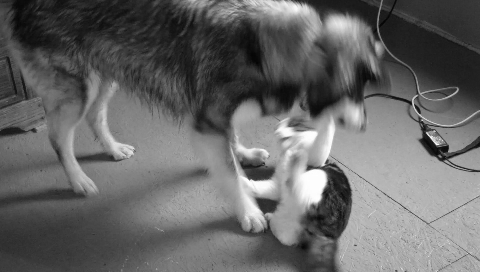

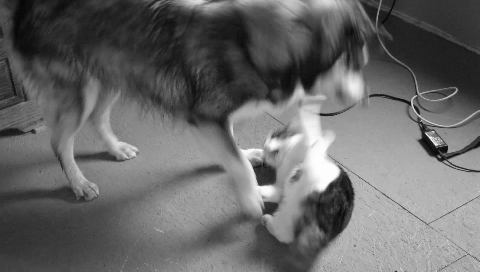

In [4]:
I1_RGB = Image.open('../data/dog_time1.jpg').convert('RGB')
I2_RGB = Image.open('../data/dog_time2.jpg').convert('RGB')
I3_RGB = Image.open('../data/dog_time3.jpg').convert('RGB')
I1_RGB = imresize_nn(I1_RGB, I1_RGB.width//4, I1_RGB.height//4, True)
I2_RGB = imresize_nn(I2_RGB, I2_RGB.width//4, I2_RGB.height//4, True)
I3_RGB = imresize_nn(I3_RGB, I3_RGB.width//4, I3_RGB.height//4, True)


F = np.array([[[0.299, 0.587, 0.114]]])
I1 = imfilter(I1_RGB, F) / 255.0
I2 = imfilter(I2_RGB, F) / 255.0

display(np2img(I1))
display(np2img(I2))

As we did before, we first need to blur the input images before computing spatial and temporal derivatives.

In [5]:
# Set the kernels
G = gaussian_kernel(sigma=1.0, dim=2)
Sx = np.array([[1.0, 0.0, -1.0], [2.0, 0.0, -2.0], [1.0, 0.0, -1.0]])
Sy = Sx.copy().T
# Blur the current and previous images using a Gaussian kernel
I1 = imfilter(I1, G)
I2 = imfilter(I2, G)
# Calculate the spatial derivatives of the current image
Ix = imfilter(I2, Sx)
Iy = imfilter(I2, Sy)
# Calculate the temporal derivative of the current image
It = (I2-I1)

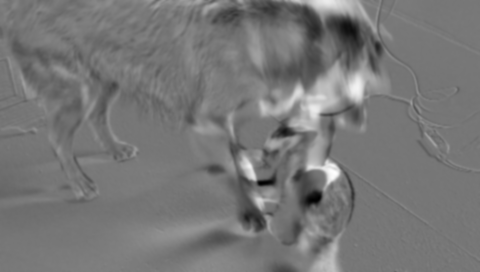

In [6]:
display(np2img(It, norm=True))

The temporal derivative image `It = (I2 - I1)` is normalised to the range of [0,1] to highlight the high-motion pixels. The high-motion pixels are displayed in either very dark or very bright tones on the temporal derivative image.

### Computing the Velocity Vector

In order to compute the velocity vector $(u_{i},v_{i})$, we need to perform the following matrix operations

$
\left[\begin{matrix} u_{i} \\ v_{i} \end{matrix}\right] = \left[\begin{matrix} \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{x}(\mathbf{p}_{j}) & \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) \\ \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{x}(\mathbf{p}_{j}) & \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) \end{matrix}\right]^{-1} \left[\begin{matrix} -\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{t}(\mathbf{p}_{j}) \\ -\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{t}(\mathbf{p}_{j}) \end{matrix}\right],
$

which requires computing the inverse of the $2 \times 2$ structure matrix. The inverse exists if and only if the determinant of the structure matrix is not equal to zero. Suppose that the inverse exits. Then we can compute the velocity vector $(u_{i},v_{i})$ as follows

$
u_{i} = \frac{-\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{t}(\mathbf{p}_{j}) +
\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{t}(\mathbf{p}_{j})}
{\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{x}(\mathbf{p}_{j}) \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) -
\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{x}(\mathbf{p}_{j})}
$

and

$
v_{i} = \frac{\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{t}(\mathbf{p}_{j}) \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) -
\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{x}(\mathbf{p}_{j}) \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{t}(\mathbf{p}_{j})}
{\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{x}(\mathbf{p}_{j}) \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) -
\sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{x}(\mathbf{p}_{j}) I_{y}(\mathbf{p}_{j}) \sum\limits_{\mathbf{p}_{j} \in \mathcal{N}_{i}} I_{y}(\mathbf{p}_{j}) I_{x}(\mathbf{p}_{j})}.
$

We can implement these operations as follows.

In [7]:
def compute_flow(I1_RGB, I2_RGB, sigma=1.0, w=3, epsilon=1e-8):
    """
    Computes and returns optical flow vector.
    """
    F = np.array([[[0.299, 0.587, 0.114]]])
    I1 = imfilter(I1_RGB, F) / 255.0
    I2 = imfilter(I2_RGB, F) / 255.0
    # Set the kernels
    G = gaussian_kernel(sigma=sigma, dim=2)
    Sx = np.array([[1.0, 0.0, -1.0], [2.0, 0.0, -2.0], [1.0, 0.0, -1.0]])
    Sy = Sx.copy().T
    # Blur the current and previous images using a Gaussian kernel
    I1 = imfilter(I1, G)
    I2 = imfilter(I2, G)
    # Calculate the spatial derivatives of the current image
    Ix = imfilter(I2, Sx)
    Iy = imfilter(I2, Sy)
    # Calculate the temporal derivative of the current image
    It = (I2-I1)
    
    B = box_filter(w, w)
    IxIx = imfilter(Ix*Ix, B)
    IxIy = imfilter(Ix*Iy, B)
    IyIy = imfilter(Iy*Iy, B)
    IxIt = imfilter(Ix*It, B)
    IyIt = imfilter(Iy*It, B)

    d = IxIx * IyIy - IxIy * IxIy
    u = np.zeros_like(d)
    v = np.zeros_like(d)
    index = (d>=epsilon)
    u[index] = (- IyIy[index] * IxIt[index] + IxIy[index] * IyIt[index]) / d[index]
    v[index] = (IxIt[index] * IxIy[index] - IxIx[index] * IyIt[index]) / d[index]
    
    return u, v

In [8]:
def draw_flow(im, u, v, delta=1.0, w=7, s=2, fill=(255,0,0), width=1):
    """
    This function draws the velocity field (u,v) on the input image im using
    w x w blocks with field scaling factors s.
    """
    im_flow = im.copy()
    draw = ImageDraw.Draw(im_flow)
    B = box_filter(w,w)
    
    u = imfilter(u, B)
    v = imfilter(v, B)
    
    uv = np.sqrt(u**2 + v**2)
    u[u<=delta] = 0.0
    v[v<=delta] = 0.0
    
    u *= s
    v *= s
    
    uv_max = w // 2
    uv_min = -uv_max
    
    u[u>=uv_max] = uv_max
    u[u<=uv_min] = uv_min
    
    v[v>=uv_max] = uv_max
    v[v<=uv_min] = uv_min
    
    for y in range(w//2, u.shape[0], w):
        for x in range(w//2, u.shape[1], w):
            draw.line((x,y) + (x+u[y,x],y+v[y,x]), fill=fill, width=width)
            
    return im_flow

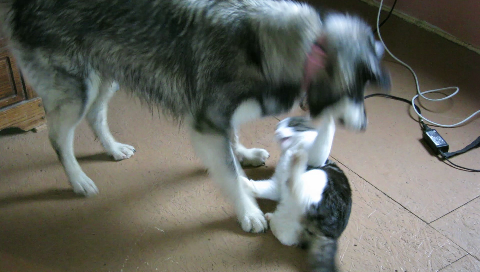

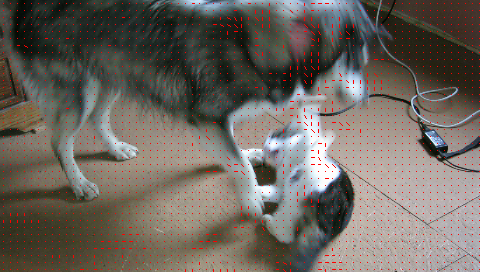

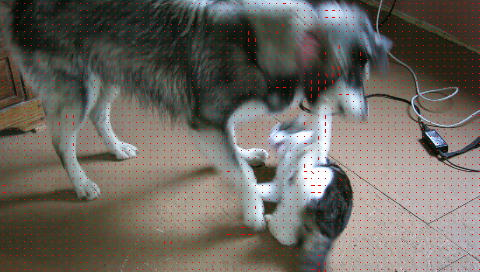

In [9]:
u,v =  compute_flow(I1_RGB, I2_RGB, w=7)
I2_RGB_flow = draw_flow(I2_RGB, u, v)
u,v =  compute_flow(I2_RGB, I3_RGB, w=7)
I3_RGB_flow = draw_flow(I3_RGB, u, v)

display(I1_RGB)
display(I2_RGB_flow)
display(I3_RGB_flow)

### Your Task [40 Marks]

By changing the parameters `sigma` and `w` of the function `compute_flow(...)`, analyse the impact of change in parameter values on the estimated velocity vector and provide a short report here. Support your discussion with experimental results on another image sequence you can find online or create yourself.

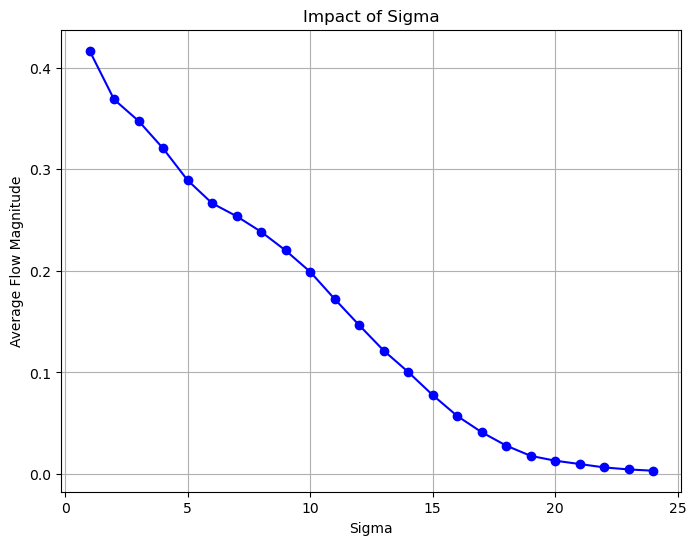

Best Sigma: 1 (Average Flow Magnitude: 0.4168)
Worst Sigma: 24 (Average Flow Magnitude: 0.0032)


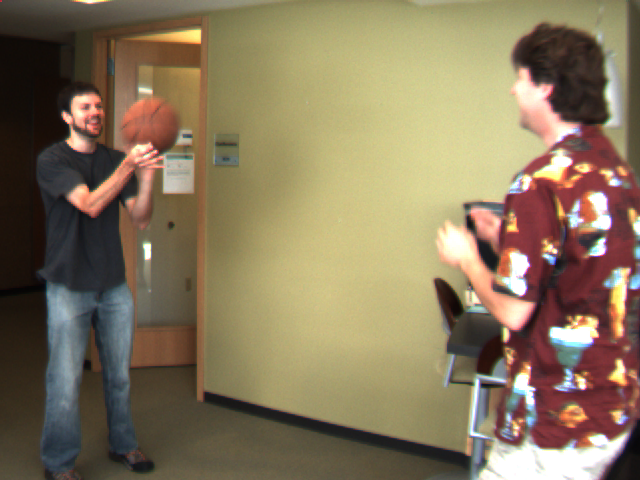

Optical Flow for Best Sigma:


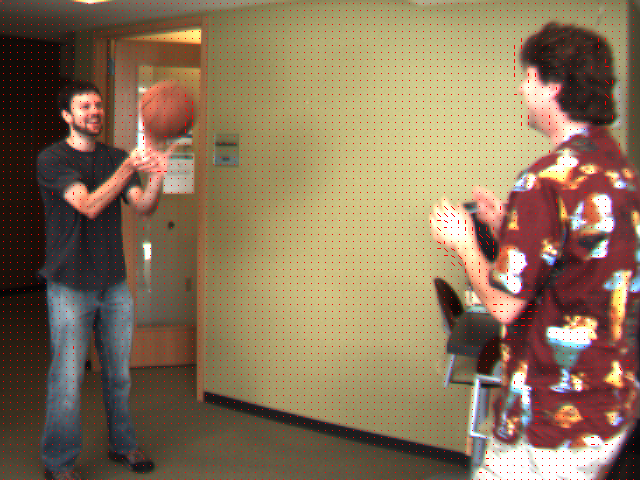

Optical Flow for Worst Sigma:


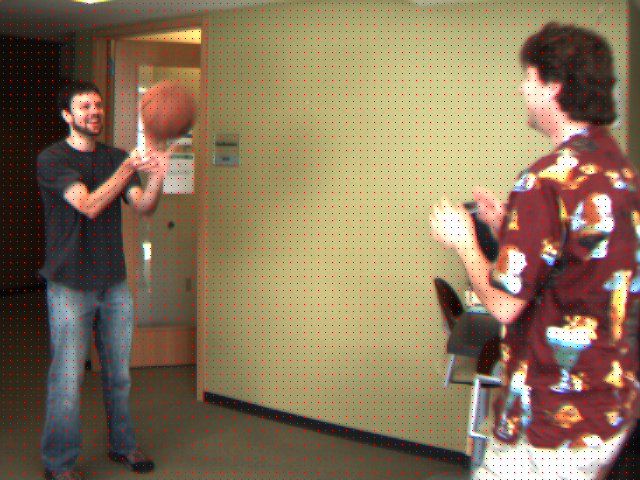

In [ ]:
"""Open the two standard images."""
#I1_RGB = Image.open('../data/dog_time1.jpg').convert('RGB')
#I2_RGB = Image.open('../data/dog_time2.jpg').convert('RGB')

"""Open the two basketball images"""
I1_RGB = Image.open('../data/basketball_1.png').convert('RGB')
I2_RGB = Image.open('../data/basketball_2.png').convert('RGB')

"""Define range for sigma we want to experiment on. Chosen sigma values 1-25 with a step of 1"""
sigma_values = np.arange(1, 25, 1) 

"""Initialize an array to store the average flow magnitudes"""
average_flow_sigma = np.zeros(len(sigma_values))

"""Compute the average flow magnitude for different sigma values with a fixed w."""
for i, sigma in enumerate(sigma_values):
    u, v = compute_flow(I1_RGB, I2_RGB, sigma=sigma)
    flow_magnitude = np.sqrt(u**2 + v**2)  
    average_flow_sigma[i] = np.mean(flow_magnitude) 


"""Plot the results for sigma"""
pl.figure(figsize=(8, 6))
pl.plot(sigma_values, average_flow_sigma, marker='o', linestyle='-', color='b')
pl.xlabel('Sigma')
pl.ylabel('Average Flow Magnitude')
pl.title(f'Impact of Sigma')
pl.grid(True)
pl.show()

"""Find the best and worst sigma based on flow magnitude"""
best_sigma_index = np.argmax(average_flow_sigma)
worst_sigma_index = np.argmin(average_flow_sigma)

best_sigma = sigma_values[best_sigma_index]
worst_sigma = sigma_values[worst_sigma_index]

"""Print the best and the worst sigma"""
print(f"Best Sigma: {best_sigma} (Average Flow Magnitude: {average_flow_sigma[best_sigma_index]:.4f})")
print(f"Worst Sigma: {worst_sigma} (Average Flow Magnitude: {average_flow_sigma[worst_sigma_index]:.4f})")

"""Display optical flow for best and worst sigma"""
u_best, v_best = compute_flow(I1_RGB, I2_RGB, sigma=best_sigma)
u_worst, v_worst = compute_flow(I1_RGB, I2_RGB, sigma=worst_sigma)

best_flow = draw_flow(I2_RGB, u_best, v_best)
worst_flow = draw_flow(I2_RGB, u_worst, v_worst)

display(I1_RGB)

print("Optical Flow for Best Sigma:")
display(best_flow)

print("Optical Flow for Worst Sigma:")
display(worst_flow)

#### Sigma experiments:
By looking at the code itself in the `compute_flow` function we can see that the sigma is used to control the standard deviation of the gaussian kernel used for blurring the input images. A high sigma results in more smoothing which recused noise but can lose finer motion details, while a low sigma keeps more fine details but may introduce noise.

##### Experimental results:
From the experimental results, we see that the average flow magnitude starts high at low sigma values and gradually decreases as sigma increases. This behavior is expected because, at low sigma, Gaussian smoothing is minimal, preserving fine details and strong gradients, which results in higher flow magnitudes. However, this can also introduce noise, making the flow vectors less reliable. On the other hand, at high sigma, Gaussian smoothing becomes more aggressive, reducing noise but also blurring motion details. This leads to weaker gradients and lower flow magnitudes, as seen in the graph. The trend shows the trade-off between noise reduction and motion detail preservation, with an optimal sigma value (sigma = 1) balancing these factors effectively, and a high sigma value (e.g., sigma > 25) leading to no flow magnitude or flow vector at all.

##### Visualization:
The optical flow for the best sigma value (sigma = 1) with an average flow value of 0.4168 shows well-defined motion vectors, which looks to accuratly capture the motion of the basketball well. In this image there is not alot of noise happening as the only thing in motion is the basketball which makes it make sense for the best sigma to be 1. For other more noisier images the optimal sigma value would likely be higher than 1. The optical flow for the worst sigma value (sigma = 24) with an average flow value of 0.0032 leads to a significant loss of detail with overly smoothed vectors leading to no capture of meaningful motion.

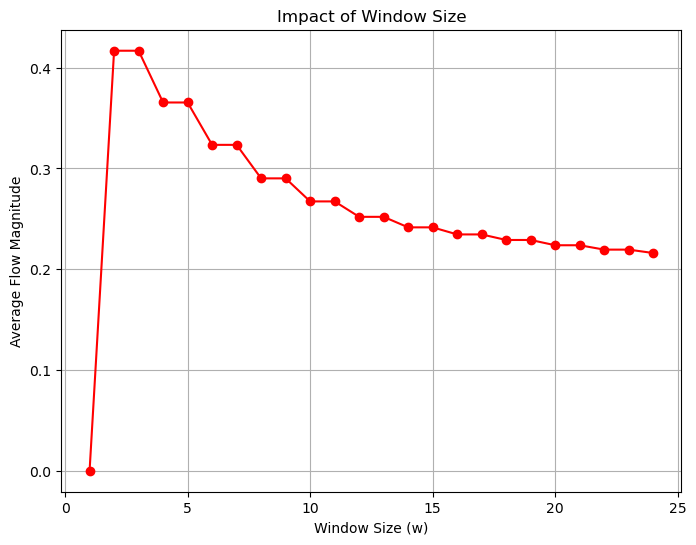

Best Window Size: 2 (Average Flow Magnitude: 0.4168)
Worst Window Size: 24 (Average Flow Magnitude: 0.2160)


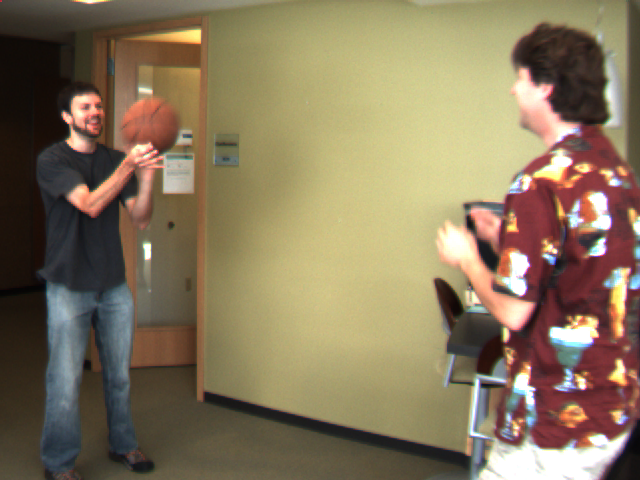

Optical Flow for Best Window Size:


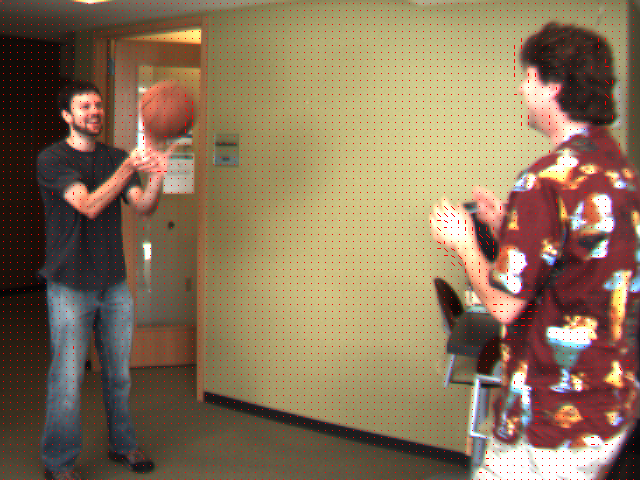

Optical Flow for Worst Window Size (not including 1):


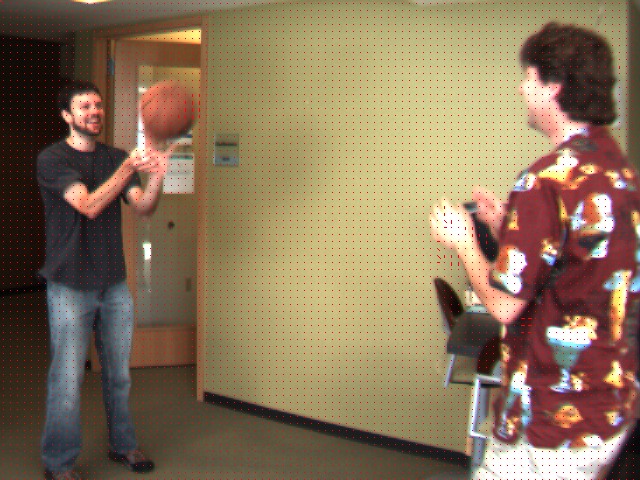

In [11]:
"""Define range for window size"""
w_values = np.arange(1, 25, 1)

"""Initialize an array to store the average flow magnitudes"""
average_flow_w = np.zeros(len(w_values))  

"""Compute the average flow magnitude for different w values with a fixed sigma."""
for j, w in enumerate(w_values):
    u, v = compute_flow(I1_RGB, I2_RGB, w=w)
    flow_magnitude = np.sqrt(u**2 + v**2)  
    average_flow_w[j] = np.mean(flow_magnitude)

"""Plot the results for window size"""
pl.figure(figsize=(8, 6))
pl.plot(w_values, average_flow_w, marker='o', linestyle='-', color='r')
pl.xlabel('Window Size (w)')
pl.ylabel('Average Flow Magnitude')
pl.title(f'Impact of Window Size')
pl.grid(True)
pl.show()

"""Find the best and worst w based on flow magnitude"""
best_w_index = np.argmax(average_flow_w)
worst_w_index = np.argmin(average_flow_w[1:]) + 1 

best_w = w_values[best_w_index]
worst_w = w_values[worst_w_index]

print(f"Best Window Size: {best_w} (Average Flow Magnitude: {average_flow_w[best_w_index]:.4f})")
print(f"Worst Window Size: {worst_w} (Average Flow Magnitude: {average_flow_w[worst_w_index]:.4f})")

"""Display optical flow for best and worst window size"""
u_best, v_best = compute_flow(I1_RGB, I2_RGB, w=best_w)
u_worst, v_worst = compute_flow(I1_RGB, I2_RGB, w=25)

best_flow = draw_flow(I2_RGB, u_best, v_best)
worst_flow = draw_flow(I2_RGB, u_worst, v_worst)

display(I1_RGB)

print("Optical Flow for Best Window Size:")
display(best_flow)

print("Optical Flow for Worst Window Size (not including 1):")
display(worst_flow)

#### Window Size Experiments:

By looking at the code itself in the `compute_flow` function, we can see that the window size (w) controls the size of the box filter used to computer optical flow. A large window size makes the algorithm capture motion over a broader area, which can help for cases with large deplacements or smooth motions. However, it can also miss finer details and fail to capture small, quick motions. On the other hand, a small window size preserves finer details and is better for small localized motions, but can struggle with larger motions and be more sensitive to noise.

##### Experimental results:

From the experimental results we can see that the average flow magnitude starts very low at a window size of 1, as the box filter becomes to small to capture any meaningful motion. At a window size of 2, the flow magnitude improves significantly by reaching its peak with an average flow magnitude of 0.4168. This suggests that a slightly larger window size is needed to capture motion effectively. However, we can see from the graph that as the window size decreases from this point the average flow magnitude decreases gradually. This makes sense as a large window size usually smooth out motion details, leading to weaker gradients and less precise flow vectors. The window size of 2 seems to capture motion while preserving details effectively. 

##### Visualization:
The optical flow for the best window size (w=2) with an average flow magnitude of 0.4168 shows good motion vectors that accurately capture the motion of the basketball as well as the motion of the person on the right. Because the basketball is the primary object in the image and the scene is relatively noise-free a smaller window size manages to capture the motion effectively. For more complex or noisy scenes, a larger window size might be needed to handle larger displacements or reduce noise. For the optical flow for the worst window size excluding 1 (w=25) with an average flow magnitude of 0.0032, we see a loss of detail, but it still manages to capture the motion of the primary object (basketball) well. From this we can conclude that lower window sizes preserve more detail with more noise in this case the movement of basketball and person on the right, while a large window size keeps less but important details with just the basketball.


### Your Task [40 Marks]

Lucas–Kanade method fails if the motion is large. Find two image sequences for failure and success cases of the Lucas–Kanade method and demonstrate the performance of the Lucas–Kanade method on those image sequences. You can also create your own image sequences. However, you must place those image sequences under the `data` folder.

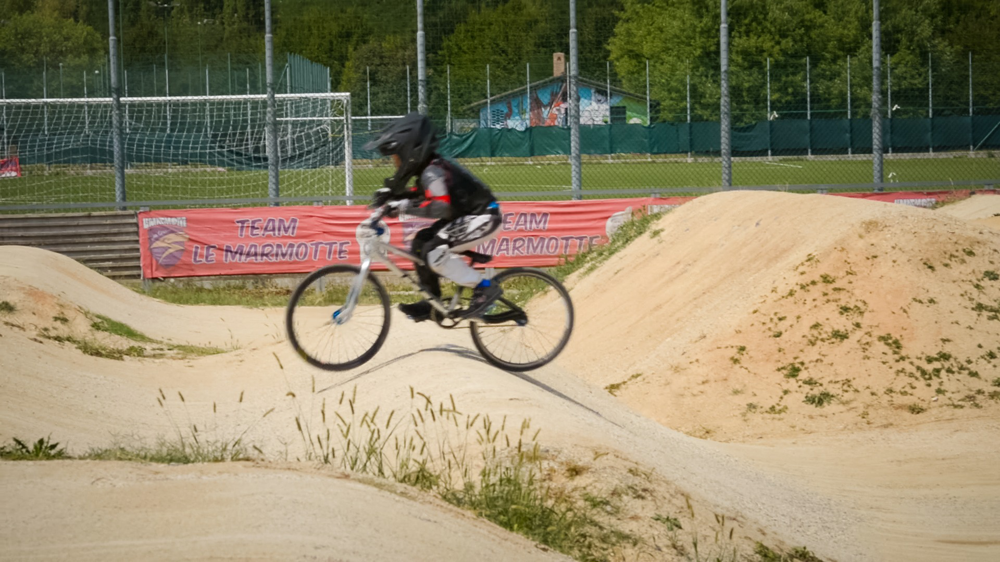

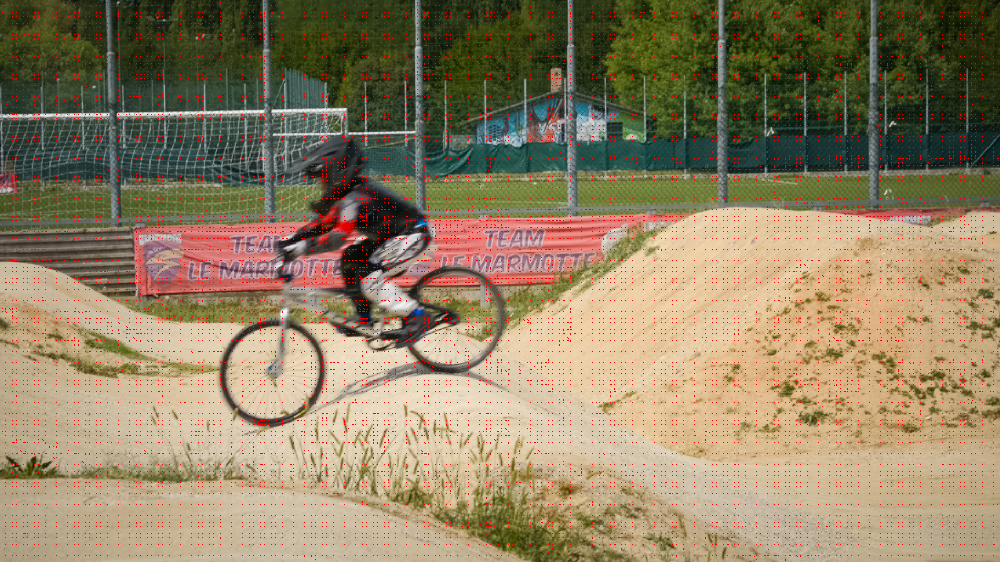

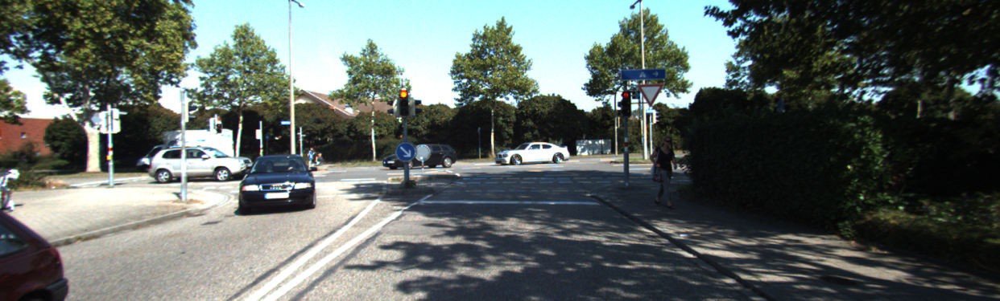

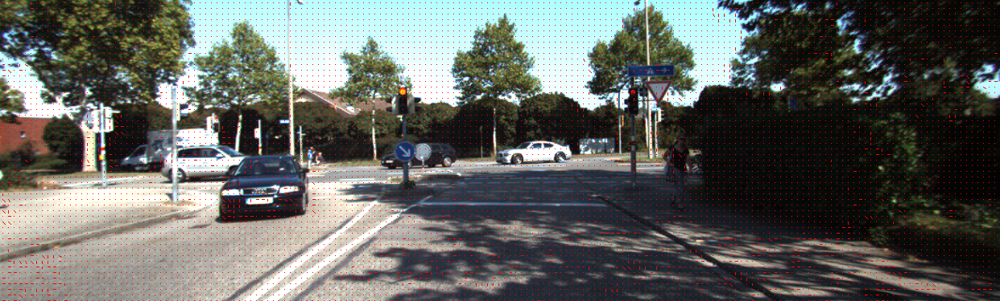

In [18]:
I1_RGB = Image.open('../data/00022.jpg').convert('RGB')
I2_RGB = Image.open('../data/00024.jpg').convert('RGB')

u,v =  compute_flow(I1_RGB, I2_RGB)
I2_RGB_flow = draw_flow(I2_RGB, u, v)

display(I1_RGB)
display(I2_RGB_flow)

I1_RGB = Image.open('../data/success_1.png').convert('RGB')
I2_RGB = Image.open('../data/success_2.png').convert('RGB')

u,v =  compute_flow(I1_RGB, I2_RGB)
I2_RGB_flow = draw_flow(I2_RGB, u, v)

display(I1_RGB)
display(I2_RGB_flow)

#### Failure and Success Report:
For this experiment it was difficult to find an image sequence online that had incredibly high motion, so i used the fastest motion image sequence i could find. The Lucas-Kanade method was tested on two images sequences: a motorcross jump (failure case) and a slow moving car (success case). For the motorcross jump, the method failed to produce good optical flow because of the large motion and blurriness of the scene. It followed the actual person okay but struggled to capture the direction of the bike itself, and it looks like the model predicts the bike should be further back than it is due to the motion. This shows that the model begins to struggle when the motion is quick and the images are blurry.

On the other hand the method worked well on the car sequence where the motion is small and the scene had better textures. There is some noise in the image but the optical flow vectors accurately captured the cars motion as well as the person walking on the rights's motion. From this we see that the method is more efficient when its assumptions of small motion and spatial coherence are satisfied.

### Your Task [20 Marks]

The Lucas-Kanade method fails if the motion is large. How can you improve the Lucas-Kanade method to handle large motions? Justify your answer with experiments and evidence from the literature.

In [22]:
def gaussian_pyramid(image, levels):
    """Build a Gaussian pyramid for an image."""
    pyramid = [image]
    for _ in range(levels - 1):
        image = imresize_bi(image, (0, 0), fx=0.5, fy=0.5)
        pyramid.append(image)
    return pyramid

def compute_flow_pyramidal(I1, I2, levels=3, w=15):
    """Compute optical flow using a pyramidal Lucas-Kanade approach."""
    # Build Gaussian pyramids for both images
    pyramid_I1 = gaussian_pyramid(I1, levels)
    pyramid_I2 = gaussian_pyramid(I2, levels)

    # Initialize flow at the coarsest level
    u = np.zeros_like(pyramid_I1[-1][..., 0])
    v = np.zeros_like(pyramid_I1[-1][..., 0])

    # Compute flow from coarsest to finest level
    for level in range(levels - 1, -1, -1):
        # Resize flow to current level
        if level != levels - 1:
            u = 2 * imresize_bi(u, (pyramid_I1[level].shape[1], pyramid_I1[level].shape[0]))
            v = 2 * imresize_bi(v, (pyramid_I1[level].shape[1], pyramid_I1[level].shape[0]))

        # Warp the second image using the current flow estimate
        warped_I2 = warp_image(pyramid_I2[level], u, v)

        # Compute residual flow at the current level
        du, dv = compute_flow(pyramid_I1[level], warped_I2, w=w)

        # Update the flow estimate
        u += du
        v += dv

    return u, v

def warp_image(image, u, v):
    """Warp an image using the flow vectors (u, v)."""
    h, w = image.shape[:2]
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    map_x = (x + u).astype(np.float32)
    map_y = (y + v).astype(np.float32)
    warped = cv2.remap(image, map_x, map_y, interpolation=cv2.INTER_LINEAR)
    return warped

# Load failure case images
I1_RGB = np.array(Image.open('../data/00022.jpg').convert('RGB'))
I2_RGB = np.array(Image.open('../data/00024.jpg').convert('RGB'))

# Compute optical flow using pyramidal Lucas-Kanade
u, v = compute_flow_pyramidal(I1_RGB, I2_RGB, levels=3, w=15)

# Visualize the flow
I2_RGB_flow_pyramidal = draw_flow(I2_RGB, u, v)
display(I2_RGB_flow_pyramidal, title="Pyramidal Lucas-Kanade Flow")

TypeError: imresize_bi() got an unexpected keyword argument 'fx'